In [1]:
import cmocean as cmo
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.animation as animation
from matplotlib.gridspec import GridSpec
from matplotlib.gridspec import GridSpecFromSubplotSpec
from matplotlib.lines import Line2D
%matplotlib inline
import numpy as np
from scipy import signal
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from xmitgcm import open_mdsdataset

In [2]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [2]:
# Functions
def plot_ssh(ds, nt, vmin=-0.3, vmax=0.3):
    W1 = ds['ETAN'][nt,:,:]
    W2 = ds['ETAN'][nt+2,:,:]
    W3 = ds['ETAN'][nt+4,:,:]
    W4 = ds['ETAN'][nt+6,:,:]
    W5 = ds['ETAN'][nt+8,:,:]
    W6 = ds['ETAN'][nt+10,:,:]
   
    fig, ((ax0,ax1,ax2),(ax3,ax4,ax5)) = plt.subplots(2,3,figsize=(15,11), sharey=True, sharex=True)
    ax0.set_facecolor('tan')
    ax1.set_facecolor('tan')
    ax2.set_facecolor('tan')
    ax3.set_facecolor('tan')
    ax4.set_facecolor('tan')
    ax5.set_facecolor('tan')

    pc = ax0.pcolormesh(LON,LAT, np.ma.masked_array(np.squeeze(W1*100),mask=mask[0,:,:]),
                       cmap=cmo.cm.delta, vmin=vmin, vmax=vmax)
    ax0.contour(LON,LAT, np.ma.masked_array(np.squeeze(W1*100),mask=mask[0,:,:]),levels=[0], colors='0.5')
    ax0.contour(LON,LAT,depth, levels=[0,250], colors='k')

    pc = ax1.pcolormesh(LON,LAT, np.ma.masked_array(np.squeeze(W2*100),mask=mask[0,:,:]),
                      cmap=cmo.cm.delta, vmin=vmin, vmax=vmax)
    ax1.contour(LON,LAT, np.ma.masked_array(np.squeeze(W2*100),mask=mask[0,:,:]),levels=[0], colors='0.5')
    ax1.contour(LON,LAT,depth, levels=[0,250], colors='k')

    pc = ax2.pcolormesh(LON,LAT, np.ma.masked_array(np.squeeze(W3*100),mask=mask[0,:,:]),
                      cmap=cmo.cm.delta, vmin=vmin, vmax=vmax)
    ax2.contour(LON,LAT, np.ma.masked_array(np.squeeze(W3*100),mask=mask[0,:,:]),levels=[0], colors='0.5')
    ax2.contour(LON,LAT,depth, levels=[0,250], colors='k')

    pc = ax3.pcolormesh(LON,LAT, np.ma.masked_array(np.squeeze(W4*100),mask=mask[0,:,:]),
                      cmap=cmo.cm.delta, vmin=vmin, vmax=vmax)
    ax3.contour(LON,LAT, np.ma.masked_array(np.squeeze(W4*100),mask=mask[0,:,:]),levels=[0], colors='0.5')
    ax3.contour(LON,LAT,depth, levels=[0,250], colors='k')

    pc = ax4.pcolormesh(LON,LAT, np.ma.masked_array(np.squeeze(W5*100),mask=mask[0,:,:]),
                      cmap=cmo.cm.delta, vmin=vmin, vmax=vmax)
    ax4.contour(LON,LAT, np.ma.masked_array(np.squeeze(W5*100),mask=mask[0,:,:]),levels=[0], colors='0.5')
    ax4.contour(LON,LAT,depth, levels=[0,250], colors='k')

    pc = ax5.pcolormesh(LON,LAT, np.ma.masked_array(np.squeeze(W6*100),mask=mask[0,:,:]),
                      cmap=cmo.cm.delta, vmin=vmin, vmax=vmax)
    ax5.contour(LON,LAT, np.ma.masked_array(np.squeeze(W6*100),mask=mask[0,:,:]),levels=[0], colors='0.5')
    ax5.contour(LON,LAT,depth, levels=[0,250], colors='k')

    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    cbar_ax = fig.add_axes([0.91, 0.125, 0.022, 0.755])
    cb = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmo.cm.delta),
                      cax=cbar_ax, orientation='vertical',label='cm')
    
    for ax in [ax0,ax1,ax2,ax3,ax4,ax5]:
        # ssh transects
        for ii in range(len(lon_inds)):
            ax.plot(lon[lon_inds[ii]],lat[lat_inds[ii]],'ro', markersize=4)

    ax3.set_xlabel('Lon')
    ax4.set_xlabel('Lon')
    ax5.set_xlabel('Lon')
    ax0.set_ylabel('Lat')
    ax3.set_ylabel('Lat')

    ax0.set_title(r'$\eta$ at %1.2f h'%(time[nt]/3600))
    ax1.set_title(r'$\eta$ at %1.2f h'%(time[nt+2]/3600))
    ax2.set_title(r'$\eta$ at %1.2f h'%(time[nt+4]/3600))
    ax3.set_title(r'$\eta$ at %1.2f h'%(time[nt+6]/3600))
    ax4.set_title(r'$\eta$ at %1.2f h'%(time[nt+8]/3600))
    ax5.set_title(r'$\eta$ at %1.2f h'%(time[nt+10]/3600))
    
    ax0.set_xlim(-121,-114)
    ax0.set_ylim(27,35)
    for ax in [ax0,ax1,ax2,ax3,ax4,ax5]:
        ax.set_aspect(1)
    return(fig,ax0,ax1,ax2,ax3,ax4,ax5)

# ---------------------------------------------------------------------------
def plot_ssh_filt(nt, ssh_filt):
    fig, ((ax0,ax1,ax2),(ax3,ax4,ax5)) = plt.subplots(2,3,figsize=(15,11), sharey=True, sharex=True)
    ax0.set_facecolor('tan')
    ax1.set_facecolor('tan')
    ax2.set_facecolor('tan')
    ax3.set_facecolor('tan')
    ax4.set_facecolor('tan')
    ax5.set_facecolor('tan')

    pc = ax0.pcolormesh(LON,LAT, np.ma.masked_array(np.squeeze(ssh_filt[nt,:,:]*100),mask=mask[0,:,:]),
                       cmap=cmo.cm.delta, vmin=-0.2, vmax=0.2)
    ax0.contour(LON,LAT, np.ma.masked_array(np.squeeze(ssh_filt[nt,:,:]*100),mask=mask[0,:,:]),
                levels=[0], colors='0.5')
    ax0.contour(LON,LAT,depth, levels=[0,250], colors='k')

    pc = ax1.pcolormesh(LON,LAT, np.ma.masked_array(np.squeeze(ssh_filt[nt+1,:,:]*100),mask=mask[0,:,:]),
                      cmap=cmo.cm.delta, vmin=-0.2, vmax=0.2)
    ax1.contour(LON,LAT, np.ma.masked_array(np.squeeze(ssh_filt[nt+1,:,:]*100),mask=mask[0,:,:]),
                levels=[0], colors='0.5')
    ax1.contour(LON,LAT,depth, levels=[0,250], colors='k')

    pc = ax2.pcolormesh(LON,LAT, np.ma.masked_array(np.squeeze(ssh_filt[nt+2,:,:]*100),mask=mask[0,:,:]),
                      cmap=cmo.cm.delta, vmin=-0.2, vmax=0.2)
    ax2.contour(LON,LAT, np.ma.masked_array(np.squeeze(ssh_filt[nt+2,:,:]*100),mask=mask[0,:,:]),
                levels=[0], colors='0.5')
    ax2.contour(LON,LAT,depth, levels=[0,250], colors='k')

    pc = ax3.pcolormesh(LON,LAT, np.ma.masked_array(np.squeeze(ssh_filt[nt+3,:,:]*100),mask=mask[0,:,:]),
                      cmap=cmo.cm.delta, vmin=-0.2, vmax=0.2)
    ax3.contour(LON,LAT, np.ma.masked_array(np.squeeze(ssh_filt[nt+3,:,:]*100),mask=mask[0,:,:]),
                levels=[0], colors='0.5')
    ax3.contour(LON,LAT,depth, levels=[0,250], colors='k')

    pc = ax4.pcolormesh(LON,LAT, np.ma.masked_array(np.squeeze(ssh_filt[nt+4,:,:]*100),mask=mask[0,:,:]),
                      cmap=cmo.cm.delta, vmin=-0.2, vmax=0.2)
    ax4.contour(LON,LAT, np.ma.masked_array(np.squeeze(ssh_filt[nt+4,:,:]*100),mask=mask[0,:,:]),
                levels=[0], colors='0.5')
    ax4.contour(LON,LAT,depth, levels=[0,250], colors='k')

    pc = ax5.pcolormesh(LON,LAT, np.ma.masked_array(np.squeeze(ssh_filt[nt+5,:,:]*100),mask=mask[0,:,:]),
                      cmap=cmo.cm.delta, vmin=-0.2, vmax=0.2)
    ax5.contour(LON,LAT, np.ma.masked_array(np.squeeze(ssh_filt[nt+5,:,:]*100),mask=mask[0,:,:]),
                levels=[0], colors='0.5')
    ax5.contour(LON,LAT,depth, levels=[0,250], colors='k')

    norm = mpl.colors.Normalize(vmin=-0.2, vmax=0.2)
    cbar_ax = fig.add_axes([0.91, 0.125, 0.022, 0.755])
    cb = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmo.cm.delta),
                      cax=cbar_ax, orientation='vertical',label='cm')
    
    for ax in [ax0,ax1,ax2,ax3,ax4,ax5]:
        # ssh transects
        for ii in range(len(lon_inds)):
            ax.plot(lon[lon_inds[ii]],lat[lat_inds[ii]],'ro', markersize=4)

    ax3.set_xlabel('Lon')
    ax4.set_xlabel('Lon')
    ax5.set_xlabel('Lon')
    ax0.set_ylabel('Lat')
    ax3.set_ylabel('Lat')

    ax0.set_title(r'Filtered $\eta$ at %1.2f h'%(time[nt]/3600))
    ax1.set_title(r'%1.2f h'%(time[nt+1]/3600))
    ax2.set_title(r'%1.2f h'%(time[nt+2]/3600))
    ax3.set_title(r'%1.2f h'%(time[nt+3]/3600))
    ax4.set_title(r'%1.2f h'%(time[nt+4]/3600))
    ax5.set_title(r'%1.2f h'%(time[nt+5]/3600))
   
    ax0.set_xlim(-121,-114)
    ax0.set_ylim(27,35)
    for ax in [ax0,ax1,ax2,ax3,ax4,ax5]:
        ax.set_aspect(1)
    return(fig,ax0,ax1,ax2,ax3,ax4,ax5)

In [3]:
outdir = '/data/SO2/sio-kramosmusalem/09_globalwinds_noSVB_output/'
levels = [1,   2,  3,  4,  5,  6,  7,  8,  9, 10, 
          11, 12, 13, 14, 15, 16, 17,
          18, 19, 20, 21, 22, 23, 24, 25,
          26, 27, 28, 29, 30, 31,
          32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44,
          45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57,              
          58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 
          74, 79, 84, 89, 94, 99,]
ds = open_mdsdataset(outdir, prefix=['eta','dynVars'], levels=levels)

In [10]:
depth = ds.Depth[:]
LAT = ds['YC'][:]
LON = ds['XC'][:]-360
lat = ds.YC[:,0].data
lon = ds.XC[0,:].data-360

Z = ds['Z'][:]
Zl = ds['Zl'][:]

# centers mask
hFacC = ds['hFacC'][:]
hfac = np.ma.masked_values(hFacC, 0)
mask = np.ma.getmask(hfac)
dep_masked = np.ma.masked_values(depth,0)
mask_dep = np.ma.getmask(dep_masked)
time = np.arange(0,144)*600

### Domain and virtual stations

* Virtual stations try to follow 20 m isobath (20 to 30 m) - dark grey contour.
* Light grey contour: 250 m (shelf break)
* Black contour: 0 m

Depth at station: 17.2 m 
Depth at station: 0.0 m 
Depth at station: 0.0 m 
Depth at station: 20.0 m 
Depth at station: 23.0 m 
Depth at station: 20.0 m 
Depth at station: 23.0 m 
Depth at station: 33.5 m 
Depth at station: 17.2 m 
Depth at station: 33.5 m 
Depth at station: 23.0 m 
Depth at station: 26.2 m 


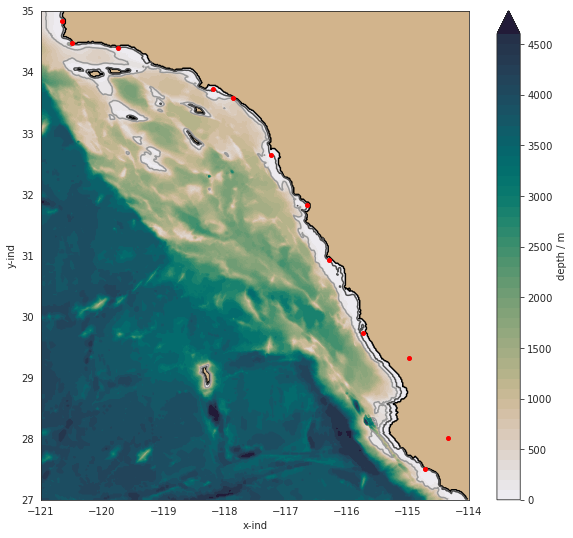

In [5]:
sns.set_style('white')
fig, ax = plt.subplots(1,1,figsize=(10,9))
ax.set_facecolor('tan')
pc = ax.contourf(LON,LAT,np.ma.masked_array(depth, mask=mask_dep),50,
                 vmin=0, vmax=5000, cmap=cmo.cm.rain, extend='max')
cb = plt.colorbar(pc, extend='max',label='depth / m')
cn = ax.contour(lon,lat,depth, colors=['0','0.3','0.6'], levels=[0,20,250])

lon_inds = [401,425,385,336,301,278,240,200,180,80,32,22]
lat_inds = [32,64,148,174,250,308,360,420,429,472,477,500]
# ssh transects
for ii in range(len(lon_inds)):
    ax.plot(lon[lon_inds[ii]],lat[lat_inds[ii]],'ro', markersize=4)
    print('Depth at station: %1.1f m ' %depth[lat_inds[ii],lon_inds[ii]])

cb.set_label('depth / m')
ax.set_xlabel('x-ind')
ax.set_ylabel('y-ind')
ax.set_xlim(-121,-114)
ax.set_ylim(27,35)
ax.set_aspect(1)

### SSH 
* 10 min averages
* Black: 0 and 250 m depth contours
* Grey: 0 m ssh 

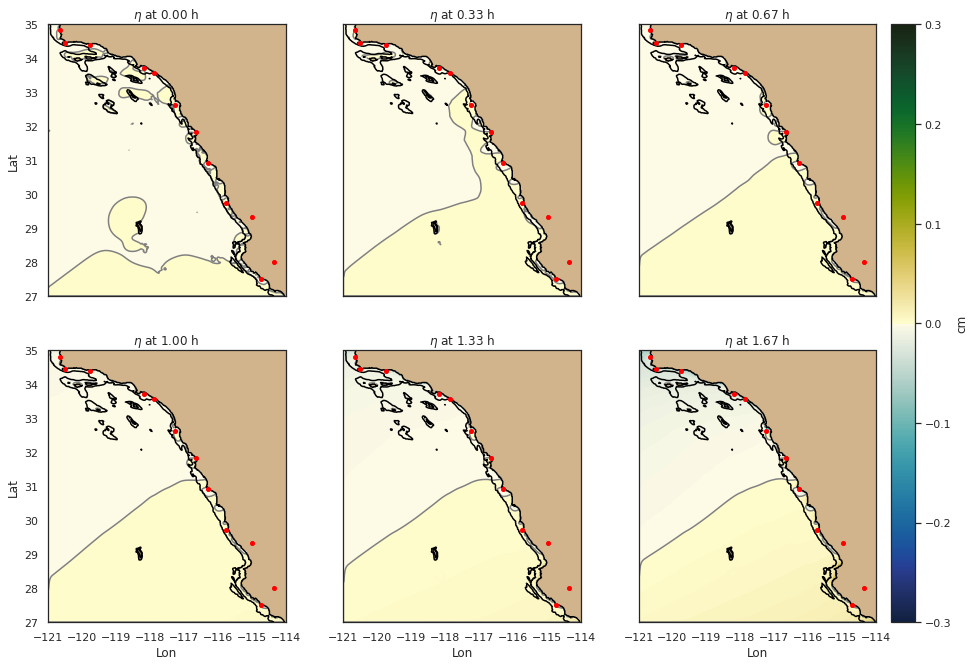

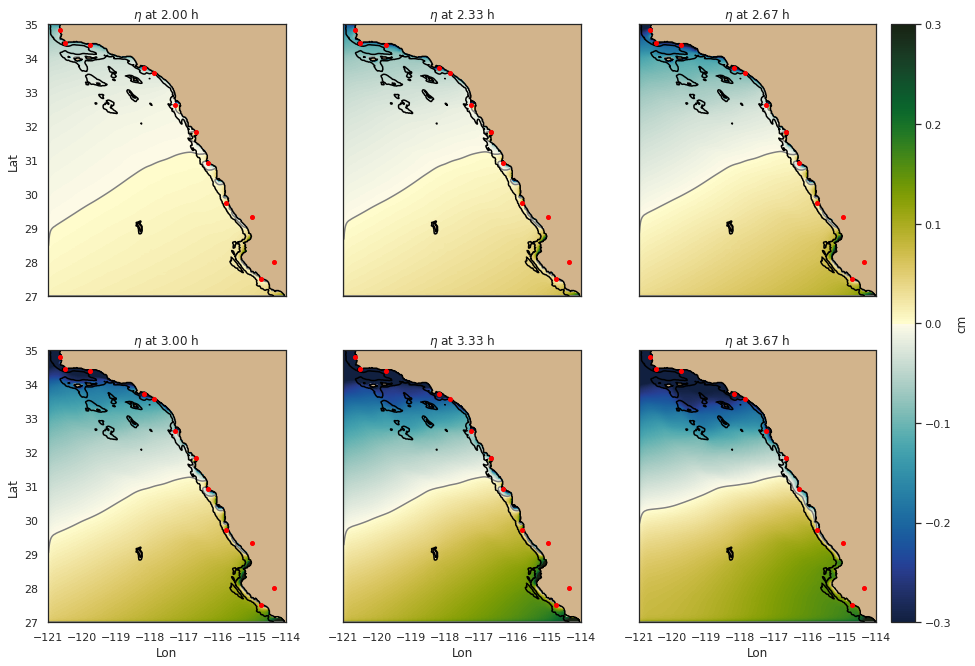

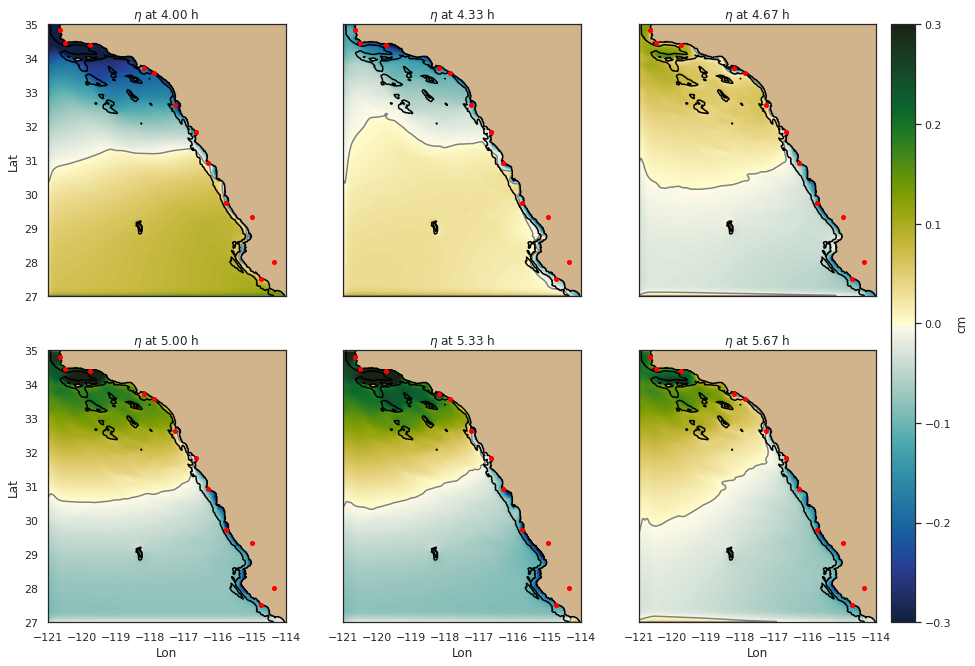

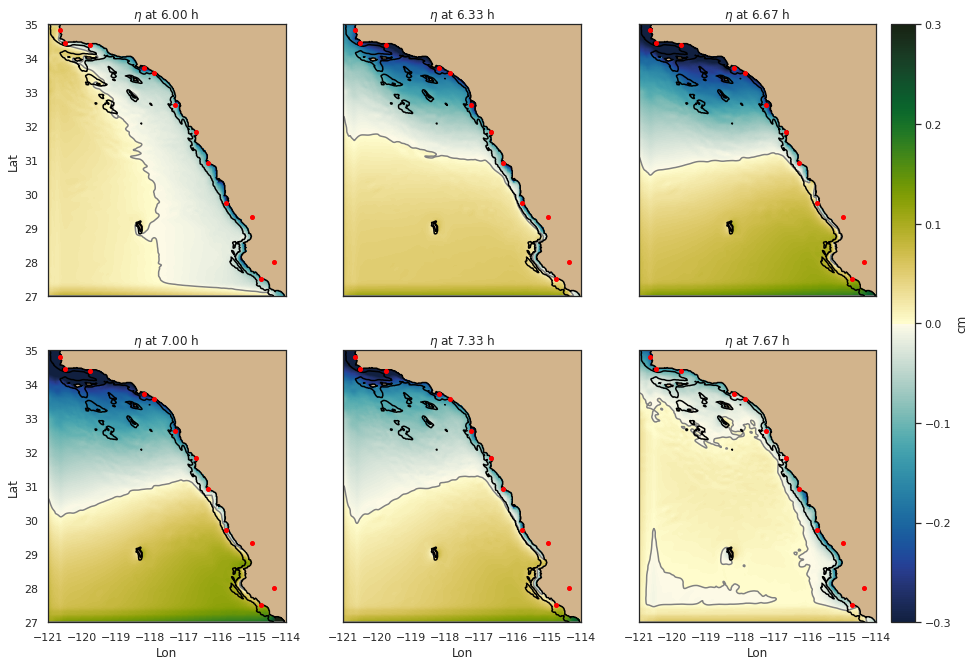

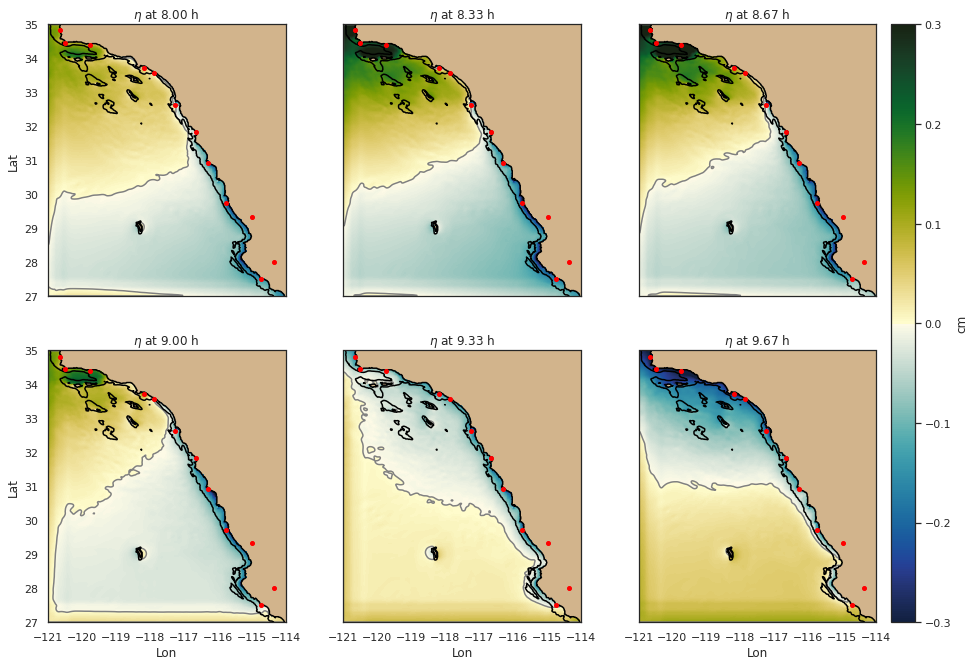

...

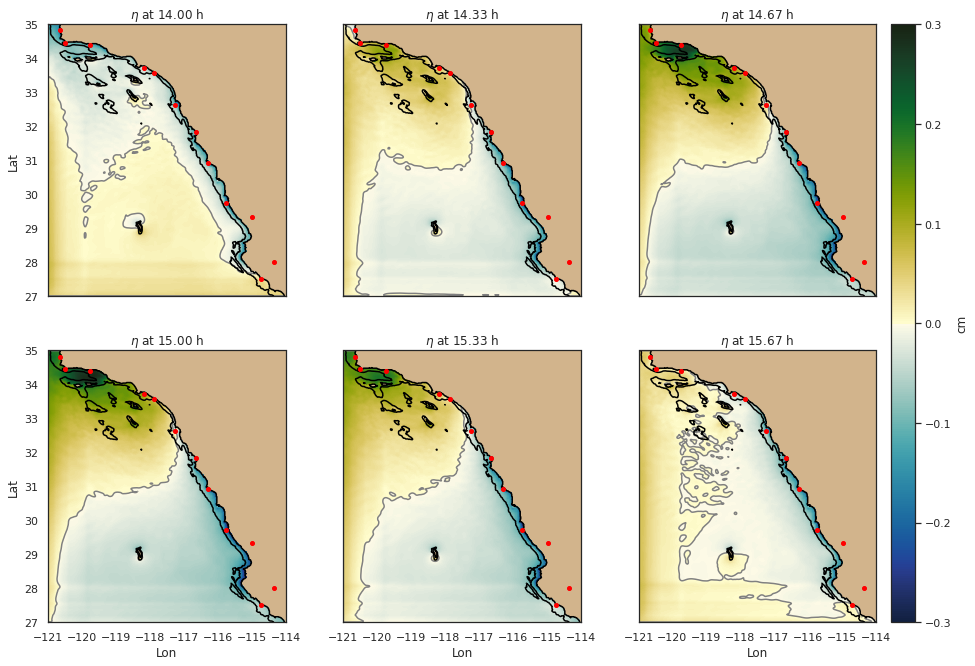

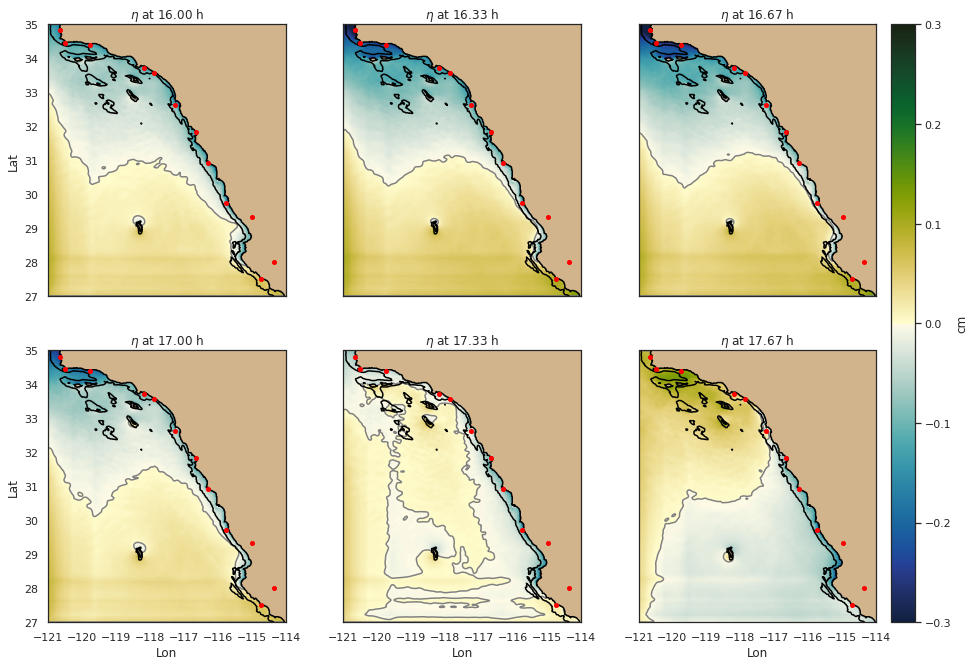

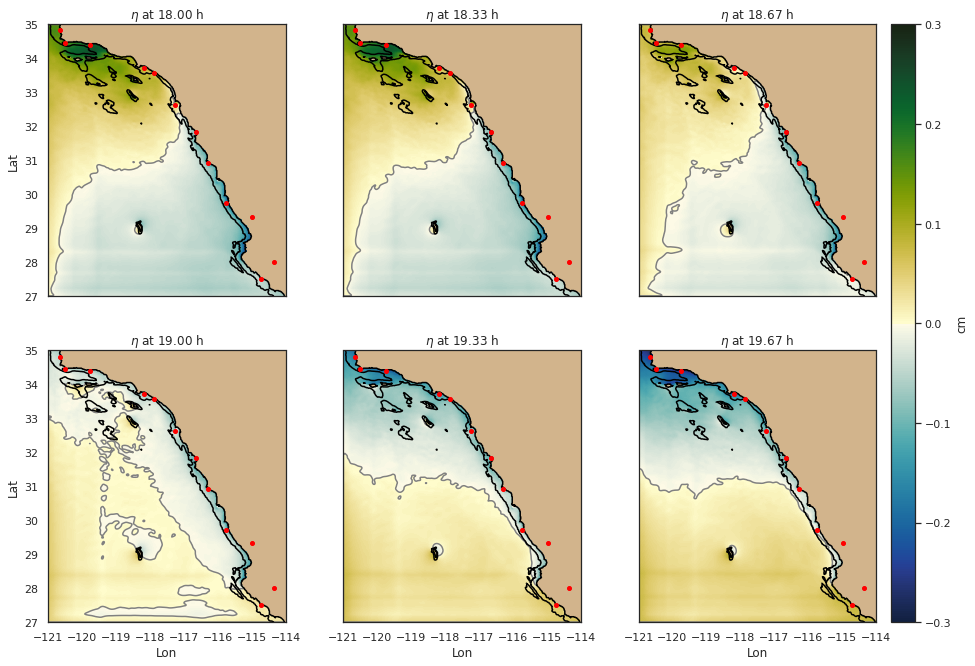

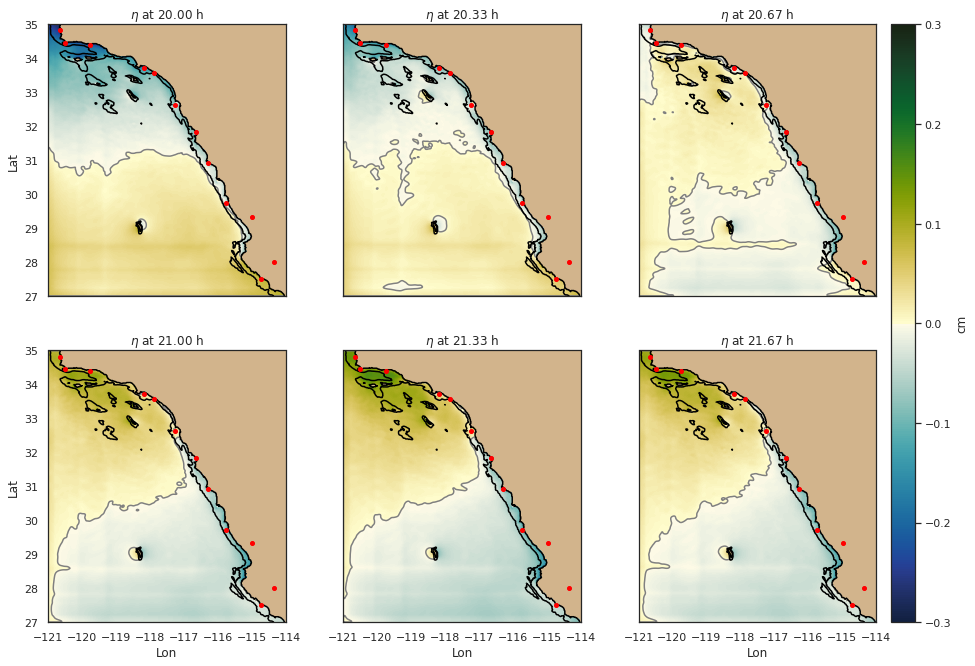

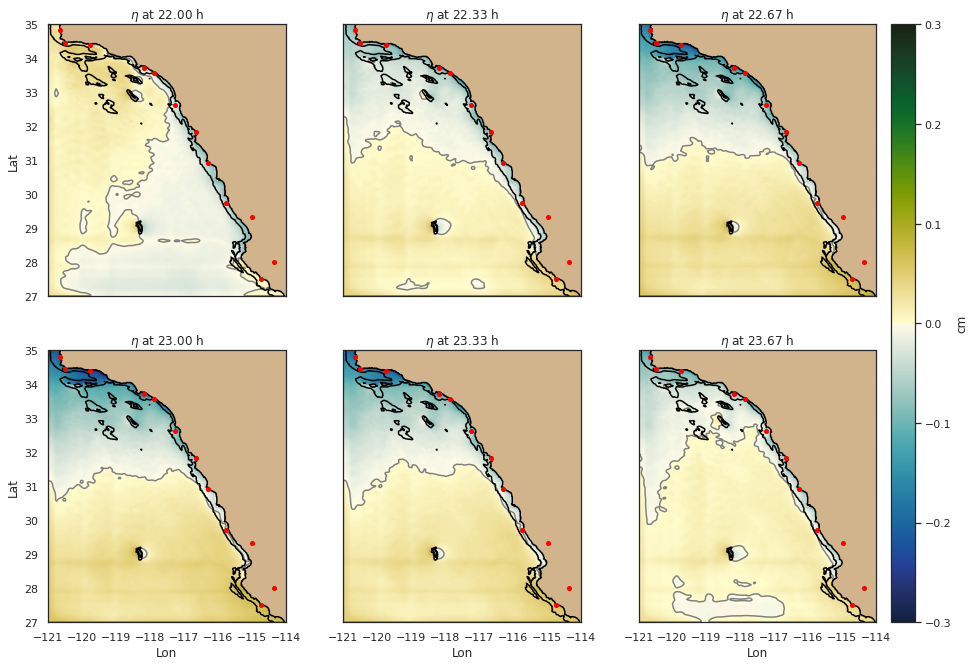

In [6]:
sns.set_context('notebook')
for nt in range(0,144,12):
    fig,ax0,ax1,ax2,ax3,ax4,ax5 = plot_ssh(ds,nt)

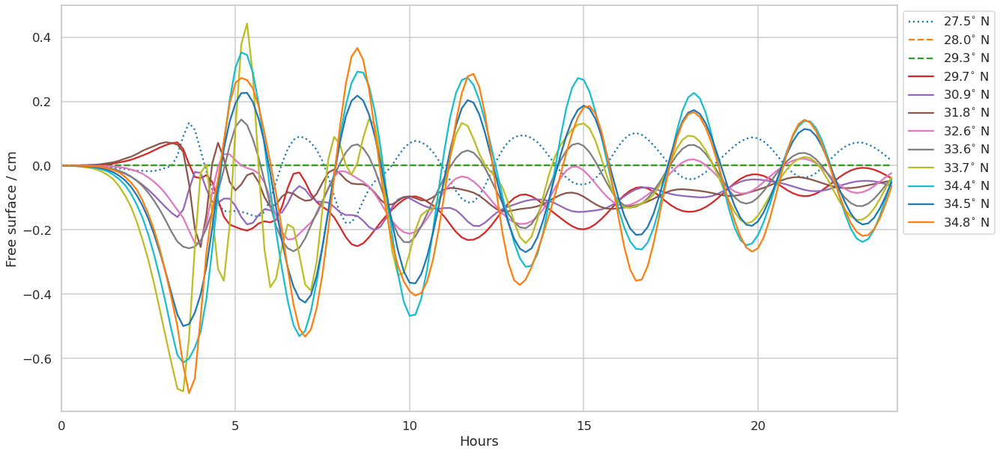

In [12]:
sns.set_context('talk')
sns.set_style('whitegrid')
fig1, (ax1) = plt.subplots(1,1, figsize=(20,10), sharey=True,sharex=True)
for ii in range(len(lat_inds)):
    eta_ts = np.squeeze(ds['ETAN'][:,lat_inds[ii],lon_inds[ii]])
    if LAT[lat_inds[ii],0]<27.8:
        ax1.plot(time/3600,(eta_ts)*1E2,':', label=r'%1.1f$^{\circ}$ N' %LAT[lat_inds[ii],0])
    elif LAT[lat_inds[ii],0]<29.5:
        ax1.plot(time/3600,(eta_ts)*1E2,'--', label=r'%1.1f$^{\circ}$ N' %LAT[lat_inds[ii],0])
    else:
        ax1.plot(time/3600,(eta_ts)*1E2,'-', label=r'%1.1f$^{\circ}$ N' %LAT[lat_inds[ii],0])

ax1.set_ylabel('Free surface / cm')
ax1.set_xlabel('Hours')
ax1.set_xlim(0,24)
ax1.legend(bbox_to_anchor=(1,1))
#ax1.set_title()
plt.show()

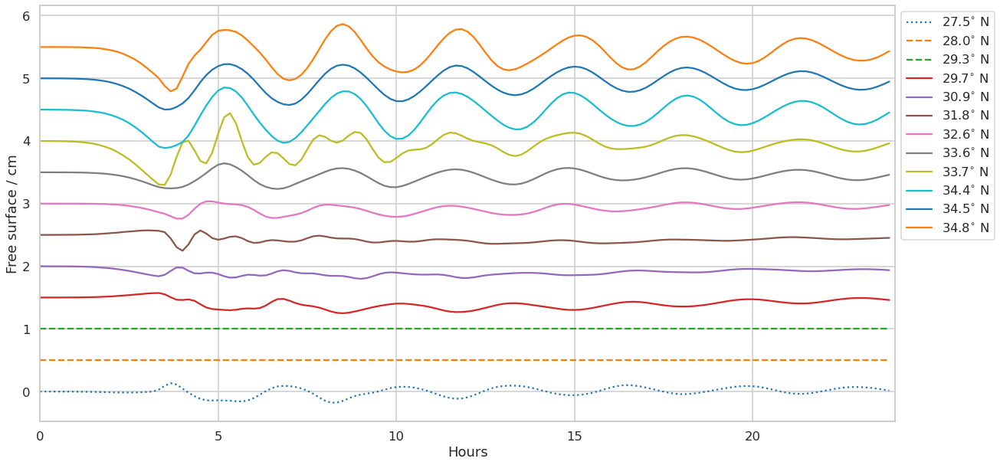

In [14]:
sns.set_context('talk')
sns.set_style('whitegrid')
fig1, (ax1) = plt.subplots(1,1, figsize=(20,10), sharey=True,sharex=True)
for ii in range(len(lat_inds)):
    eta_ts = np.squeeze(ds['ETAN'][:,lat_inds[ii],lon_inds[ii]])
    if LAT[lat_inds[ii],0]<27.8:
        ax1.plot(time/3600,(eta_ts)*1E2+(0.5*ii),':', label=r'%1.1f$^{\circ}$ N' %LAT[lat_inds[ii],0])
    elif LAT[lat_inds[ii],0]<29.5:
        ax1.plot(time/3600,(eta_ts)*1E2+(0.5*ii),'--', label=r'%1.1f$^{\circ}$ N' %LAT[lat_inds[ii],0])
    else:
        ax1.plot(time/3600,(eta_ts)*1E2+(0.5*ii),'-', label=r'%1.1f$^{\circ}$ N' %LAT[lat_inds[ii],0])

ax1.set_ylabel('Free surface / cm')
ax1.set_xlabel('Hours')
ax1.set_xlim(0,24)
ax1.legend(bbox_to_anchor=(1,1))
#ax1.set_title()
plt.show()
  

### Spectra

Welch

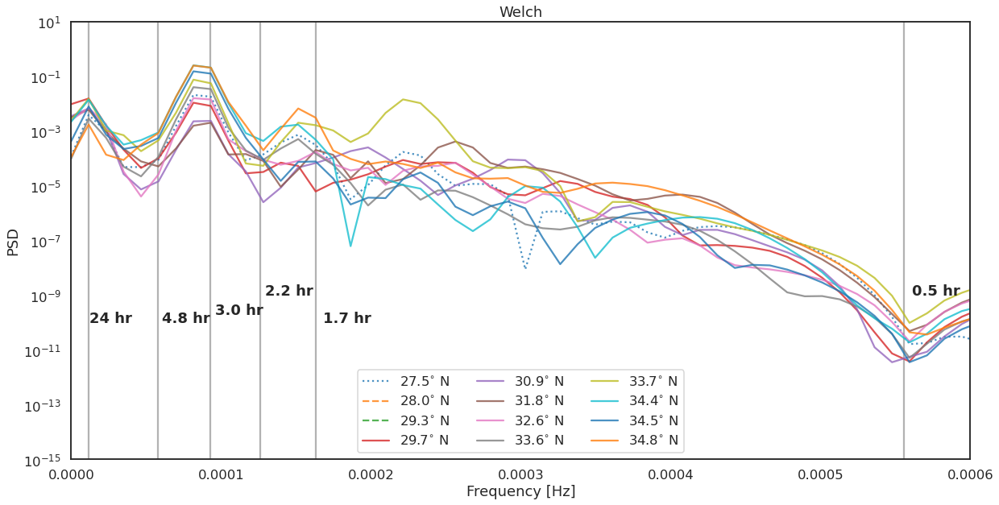

In [15]:
sns.set_context('talk')
sns.set_style('white')
samp_freq = len(time)/np.max(time) # Hz
fig,(ax) = plt.subplots(1,1,figsize=(20,10))

# Useful freq to period indicators
ax.axvline(1/(4.8*3600), color='k', alpha=0.3, linestyle='-') # 4.8 hr - max PSD - Kelvin wave
ax.axvline(1/(3.*3600), color='k', alpha=0.3, linestyle='-') # 3 hr - cutoff period
ax.axvline(1/(2.2*3600), color='k', alpha=0.3, linestyle='-') # 2.4 hr 
ax.axvline(1/(1.7*3600), color='k', alpha=0.3, linestyle='-') # 1.2 hr 
ax.axvline(1/(0.5*3600), color='k', alpha=0.3, linestyle='-') # 0.5 hr 
ax.axvline(1/(24*3600), color='k', alpha=0.3, linestyle='-') # 24 hr 
ax.text(1/((4.8-0.2)*3600),1E-10,'4.8 hr', fontweight='bold')
ax.text(1/((3.-0.1)*3600),2E-10,'3.0 hr', fontweight='bold')
ax.text(1/((2.2-0.05)*3600),1E-9,'2.2 hr', fontweight='bold')
ax.text(1/((1.7-0.05)*3600),1E-10,'1.7 hr', fontweight='bold')
ax.text(1/((0.5-0.005)*3600),1E-9,'0.5 hr', fontweight='bold')
ax.text(1/((24-1)*3600),1E-10,'24 hr', fontweight='bold')
 
for ii in range(len(lat_inds)):
    eta_ts = np.squeeze(ds['ETAN'][:,lat_inds[ii],lon_inds[ii]])
    freq_per, Pxx_den_per = signal.welch(eta_ts, samp_freq, detrend='constant')
    if LAT[lat_inds[ii],0]<27.8:
        ax.semilogy(freq_per, Pxx_den_per,':', alpha=0.8, label=r'%1.1f$^{\circ}$ N' %LAT[lat_inds[ii],0])
    elif LAT[lat_inds[ii],0]<29.5:
        ax.semilogy(freq_per, Pxx_den_per,'--', alpha=0.8, label=r'%1.1f$^{\circ}$ N' %LAT[lat_inds[ii],0])
    else:
        ax.semilogy(freq_per, Pxx_den_per,'-', alpha=0.8, label=r'%1.1f$^{\circ}$ N' %LAT[lat_inds[ii],0])
        
ax.set_ylabel('PSD')
ax.set_ylim(1E-15,10)
ax.set_xlim(0,0.0006)

ax.set_xlabel('Frequency [Hz]')
ax.set_title('Welch')
ax.legend(ncol=3)
    

### Filter 4.8 h period signal 

Cut-off at 4 hr

In [16]:
from scipy.signal import butter, filtfilt

def butter_highpass(higcut, fs, order=5):
    nyq = 0.5 * fs
    high = higcut / nyq
    b, a = butter(order, high, btype='high')
    return b, a


def butter_highpass_filter(data, highcut, fs, order=5, axis=-1):
    b, a = butter_highpass(highcut, fs, order=order)
    y = filtfilt(b, a, data, axis=axis)
    return y

def butter_lowpass(lowcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    b, a = butter(order, low, btype='low')
    return b, a


def butter_lowpass_filter(data, lowcut, fs, order=5, axis=-1):
    b, a = butter_lowpass(lowcut, fs, order=order)
    y = filtfilt(b, a, data, axis=axis)
    return y

(0.0, 24.0)

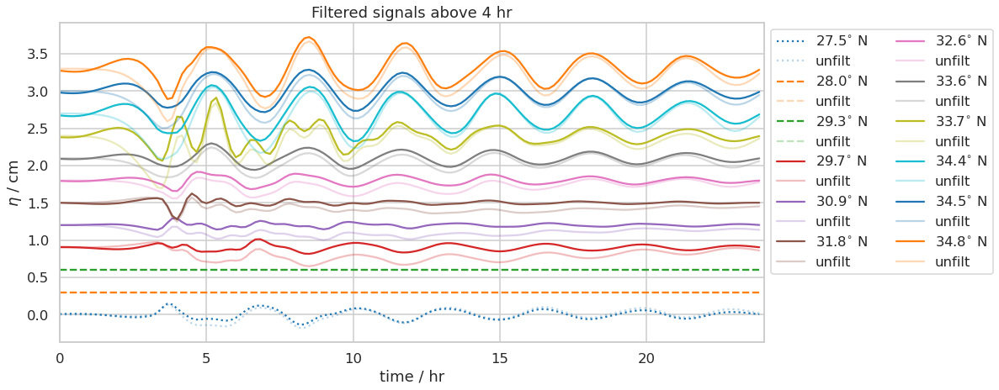

In [18]:
sns.set_context('talk')
sns.set_style('whitegrid')
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
          '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf','#1f77b4', '#ff7f0e']
fig, ax = plt.subplots(1, 1, figsize=(15,7))
# Sample rate and desired cutoff frequencies (in Hz).
fs = samp_freq
freq = 1/(4.0*3600)
highcut = freq

for ii, col in zip(range(len(lat_inds)),colors):
    eta_ts = np.squeeze(ds['ETAN'][:,lat_inds[ii],lon_inds[ii]])
    eta_filt = butter_highpass_filter(eta_ts, highcut, fs, order=5)
    if LAT[lat_inds[ii],0]<27.8:
        ax.plot(time/3600,(eta_filt)*1E2+(0.3*ii),':',color=col, label=r'%1.1f$^{\circ}$ N' %LAT[lat_inds[ii],0])
        ax.plot(time/3600,(eta_ts)*1E2+(0.3*ii),':',color=col,alpha=0.3, label='unfilt')
    elif LAT[lat_inds[ii],0]<29.5:
        ax.plot(time/3600,(eta_filt)*1E2+(0.3*ii),'--',color=col, label=r'%1.1f$^{\circ}$ N' %LAT[lat_inds[ii],0])
        ax.plot(time/3600,(eta_ts)*1E2+(0.3*ii),'--',color=col,alpha=0.3, label='unfilt')
    else:
        ax.plot(time/3600,(eta_filt)*1E2+(0.3*ii),'-',color=col, label=r'%1.1f$^{\circ}$ N' %LAT[lat_inds[ii],0])
        ax.plot(time/3600,(eta_ts)*1E2+(0.3*ii),'-',color=col,alpha=0.3, label='unfilt')

ax.set_title('Filtered signals above %g hr' % (1/(freq*3600)))
ax.legend(ncol=2, bbox_to_anchor=(1,1))
ax.set_ylabel(r'$\eta$ / cm')
ax.set_xlabel('time / hr')
ax.set_xlim(0,24)

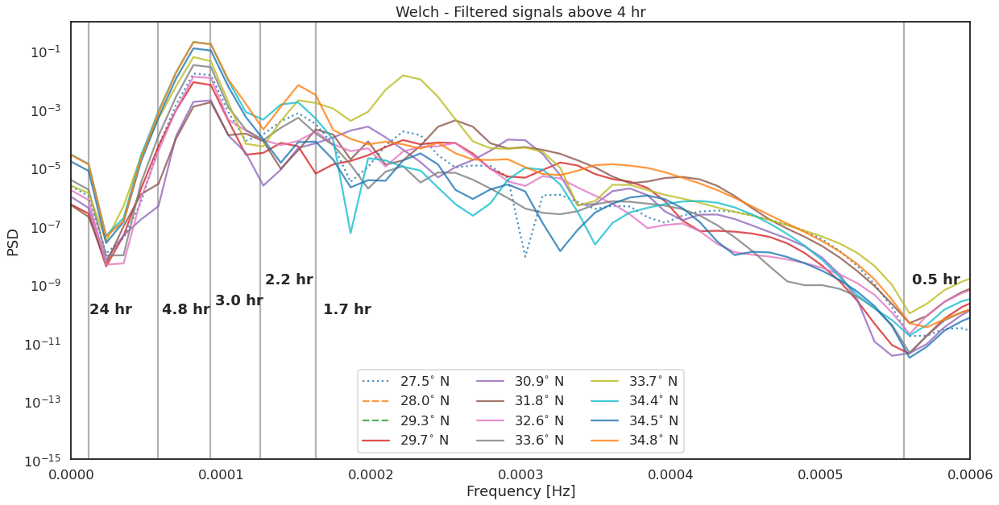

In [19]:
sns.set_context('talk')
sns.set_style('white')
samp_freq = len(time)/np.max(time) # Hz
fig,(ax) = plt.subplots(1,1,figsize=(20,10))

# Useful freq to period indicators
ax.axvline(1/(4.8*3600), color='k', alpha=0.3, linestyle='-') # 4.8 hr - max PSD - Kelvin wave
ax.axvline(1/(3.*3600), color='k', alpha=0.3, linestyle='-') # 3 hr - cutoff period
ax.axvline(1/(2.2*3600), color='k', alpha=0.3, linestyle='-') # 2.4 hr 
ax.axvline(1/(1.7*3600), color='k', alpha=0.3, linestyle='-') # 1.2 hr 
ax.axvline(1/(0.5*3600), color='k', alpha=0.3, linestyle='-') # 0.5 hr 
ax.axvline(1/(24*3600), color='k', alpha=0.3, linestyle='-') # 24 hr 
ax.text(1/((4.8-0.2)*3600),1E-10,'4.8 hr', fontweight='bold')
ax.text(1/((3.-0.1)*3600),2E-10,'3.0 hr', fontweight='bold')
ax.text(1/((2.2-0.05)*3600),1E-9,'2.2 hr', fontweight='bold')
ax.text(1/((1.7-0.05)*3600),1E-10,'1.7 hr', fontweight='bold')
ax.text(1/((0.5-0.005)*3600),1E-9,'0.5 hr', fontweight='bold')
ax.text(1/((24-1)*3600),1E-10,'24 hr', fontweight='bold')
 
for ii in range(len(lat_inds)):
    eta_ts = np.squeeze(ds['ETAN'][:,lat_inds[ii],lon_inds[ii]])
    eta_filt = butter_highpass_filter(eta_ts, highcut, fs, order=5)
    freq_per, Pxx_den_per = signal.welch(eta_filt, samp_freq, detrend='constant')
    if LAT[lat_inds[ii],0]<27.8:
        ax.semilogy(freq_per, Pxx_den_per,':', alpha=0.8, label=r'%1.1f$^{\circ}$ N' %LAT[lat_inds[ii],0])
    elif LAT[lat_inds[ii],0]<29.5:
        ax.semilogy(freq_per, Pxx_den_per,'--', alpha=0.8, label=r'%1.1f$^{\circ}$ N' %LAT[lat_inds[ii],0])
    else:
        ax.semilogy(freq_per, Pxx_den_per,'-', alpha=0.8, label=r'%1.1f$^{\circ}$ N' %LAT[lat_inds[ii],0])
ax.set_ylabel('PSD')
ax.set_ylim(1E-15,1)
ax.set_xlim(0,0.0006)
    
ax.set_xlabel('Frequency [Hz]')
ax.set_title('Welch - Filtered signals above %g hr' % (1/(freq*3600)))
ax.legend(ncol=3)
    

(0.0, 24.0)

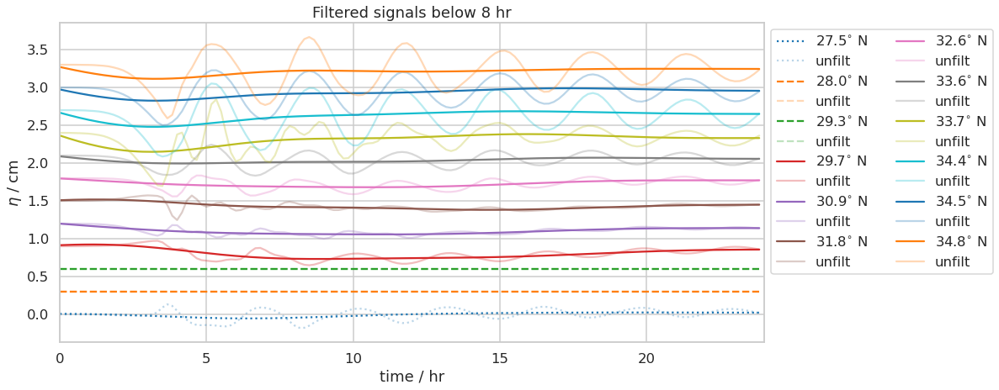

In [21]:
sns.set_context('talk')
sns.set_style('whitegrid')
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
          '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf','#1f77b4', '#ff7f0e']
fig, ax = plt.subplots(1, 1, figsize=(15,7))
# Sample rate and desired cutoff frequencies (in Hz).
fs = samp_freq
freq = 1/(8.0*3600)
lowcut = freq

for ii, col in zip(range(len(lat_inds)),colors):
    eta_ts = np.squeeze(ds['ETAN'][:,lat_inds[ii],lon_inds[ii]])
    eta_filt = butter_lowpass_filter(eta_ts, lowcut, fs, order=5)
    if LAT[lat_inds[ii],0]<27.8:
        ax.plot(time/3600,(eta_filt)*1E2+(0.3*ii),':',color=col, label=r'%1.1f$^{\circ}$ N' %LAT[lat_inds[ii],0])
        ax.plot(time/3600,(eta_ts)*1E2+(0.3*ii),':',color=col,alpha=0.3, label='unfilt')
    elif LAT[lat_inds[ii],0]<29.5:
        ax.plot(time/3600,(eta_filt)*1E2+(0.3*ii),'--',color=col, label=r'%1.1f$^{\circ}$ N' %LAT[lat_inds[ii],0])
        ax.plot(time/3600,(eta_ts)*1E2+(0.3*ii),'--',color=col,alpha=0.3, label='unfilt')
    else:
        ax.plot(time/3600,(eta_filt)*1E2+(0.3*ii),'-',color=col, label=r'%1.1f$^{\circ}$ N' %LAT[lat_inds[ii],0])
        ax.plot(time/3600,(eta_ts)*1E2+(0.3*ii),'-',color=col,alpha=0.3, label='unfilt')
ax.set_title('Filtered signals below %g hr' % (1/(freq*3600)))
ax.legend(ncol=2, bbox_to_anchor=(1,1))
ax.set_ylabel(r'$\eta$ / cm')
ax.set_xlabel('time / hr')
ax.set_xlim(0,24)

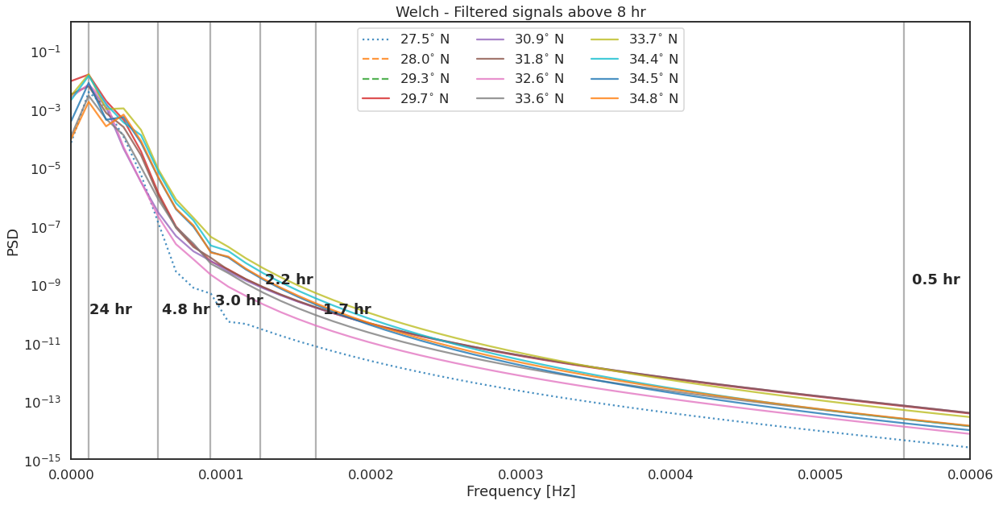

In [22]:
sns.set_context('talk')
sns.set_style('white')
samp_freq = len(time)/np.max(time) # Hz
fig,(ax) = plt.subplots(1,1,figsize=(20,10))

# Useful freq to period indicators
ax.axvline(1/(4.8*3600), color='k', alpha=0.3, linestyle='-') # 4.8 hr - max PSD - Kelvin wave
ax.axvline(1/(3.*3600), color='k', alpha=0.3, linestyle='-') # 3 hr 
ax.axvline(1/(2.2*3600), color='k', alpha=0.3, linestyle='-') # 2.4 hr 
ax.axvline(1/(1.7*3600), color='k', alpha=0.3, linestyle='-') # 1.2 hr 
ax.axvline(1/(0.5*3600), color='k', alpha=0.3, linestyle='-') # 0.5 hr 
ax.axvline(1/(24*3600), color='k', alpha=0.3, linestyle='-') # 24 hr 
ax.text(1/((4.8-0.2)*3600),1E-10,'4.8 hr', fontweight='bold')
ax.text(1/((3.-0.1)*3600),2E-10,'3.0 hr', fontweight='bold')
ax.text(1/((2.2-0.05)*3600),1E-9,'2.2 hr', fontweight='bold')
ax.text(1/((1.7-0.05)*3600),1E-10,'1.7 hr', fontweight='bold')
ax.text(1/((0.5-0.005)*3600),1E-9,'0.5 hr', fontweight='bold')
ax.text(1/((24-1)*3600),1E-10,'24 hr', fontweight='bold')
 
for ii in range(len(lat_inds)):
    eta_ts = np.squeeze(ds['ETAN'][:,lat_inds[ii],lon_inds[ii]])
    eta_filt = butter_lowpass_filter(eta_ts, lowcut, fs, order=5)
    freq_per, Pxx_den_per = signal.welch(eta_filt, samp_freq, detrend='constant')
    if LAT[lat_inds[ii],0]<27.8:
        ax.semilogy(freq_per, Pxx_den_per,':', alpha=0.8, label=r'%1.1f$^{\circ}$ N' %LAT[lat_inds[ii],0])
    elif LAT[lat_inds[ii],0]<29.5:
        ax.semilogy(freq_per, Pxx_den_per,'--', alpha=0.8, label=r'%1.1f$^{\circ}$ N' %LAT[lat_inds[ii],0])
    else:
        ax.semilogy(freq_per, Pxx_den_per,'-', alpha=0.8, label=r'%1.1f$^{\circ}$ N' %LAT[lat_inds[ii],0])
ax.set_ylabel('PSD')
ax.set_ylim(1E-15,1)
ax.set_xlim(0,0.0006)
    
ax.set_xlabel('Frequency [Hz]')
ax.set_title('Welch - Filtered signals above %g hr' % (1/(freq*3600)))
ax.legend(ncol=3)
    

### Filtered ssh maps

Filter periods above 4 hr

In [23]:
samp_freq = len(time)/np.max(time) # Hz
fs = samp_freq
freq = 1/(4*3600)
highcut = freq
ssh_filt = butter_highpass_filter(ds['ETAN'][:], highcut, fs, order=5, axis=0)

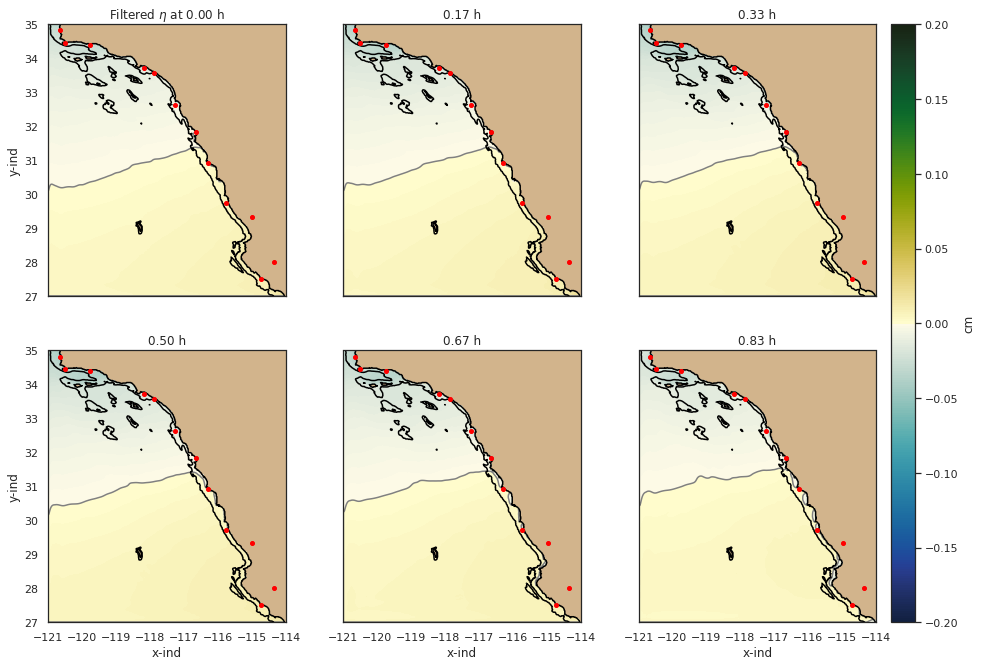

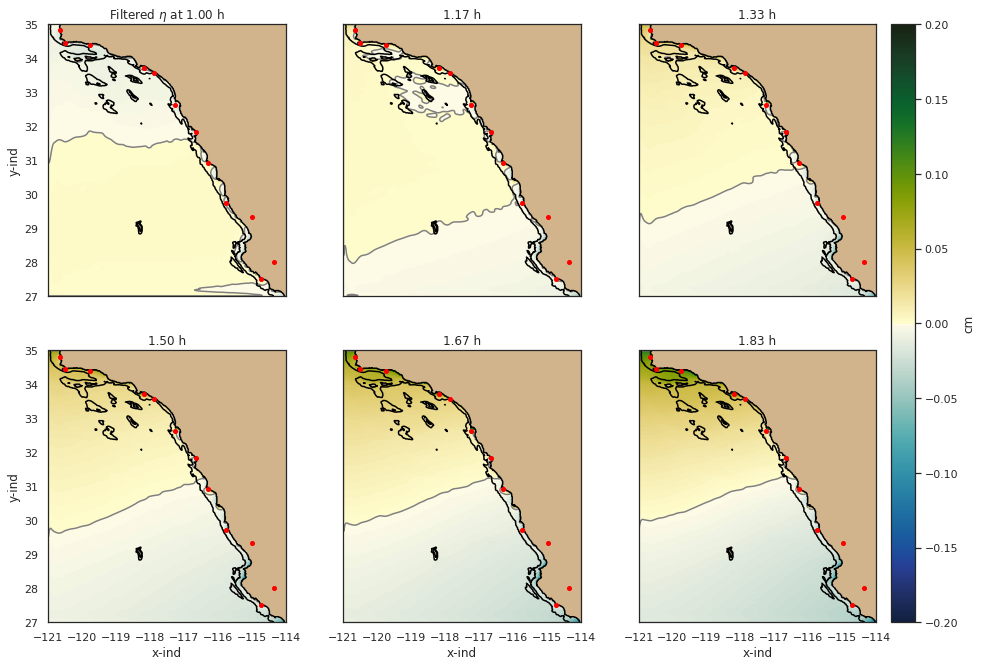

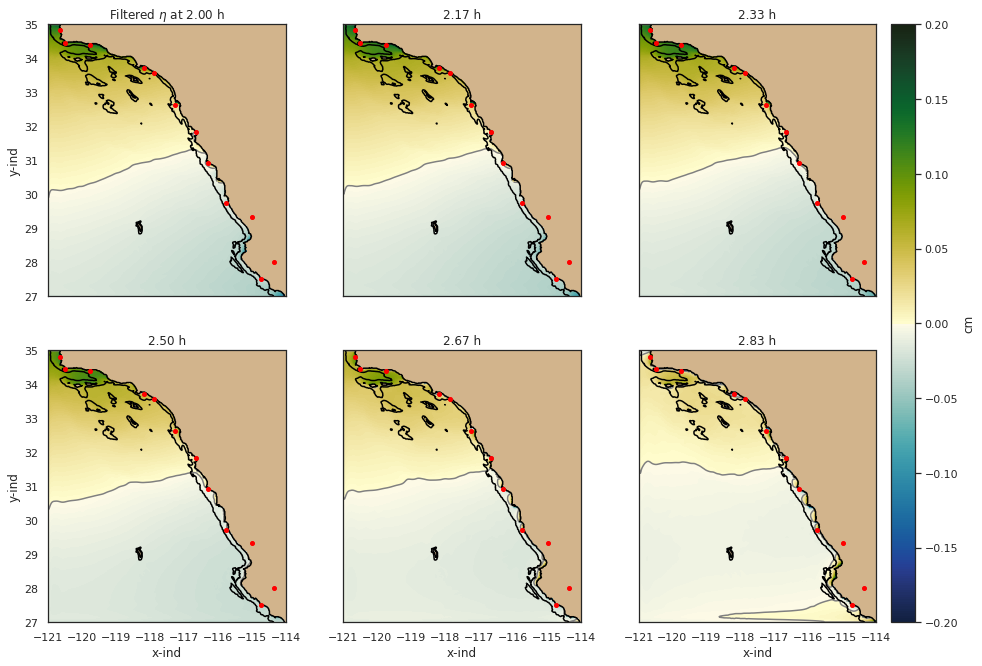

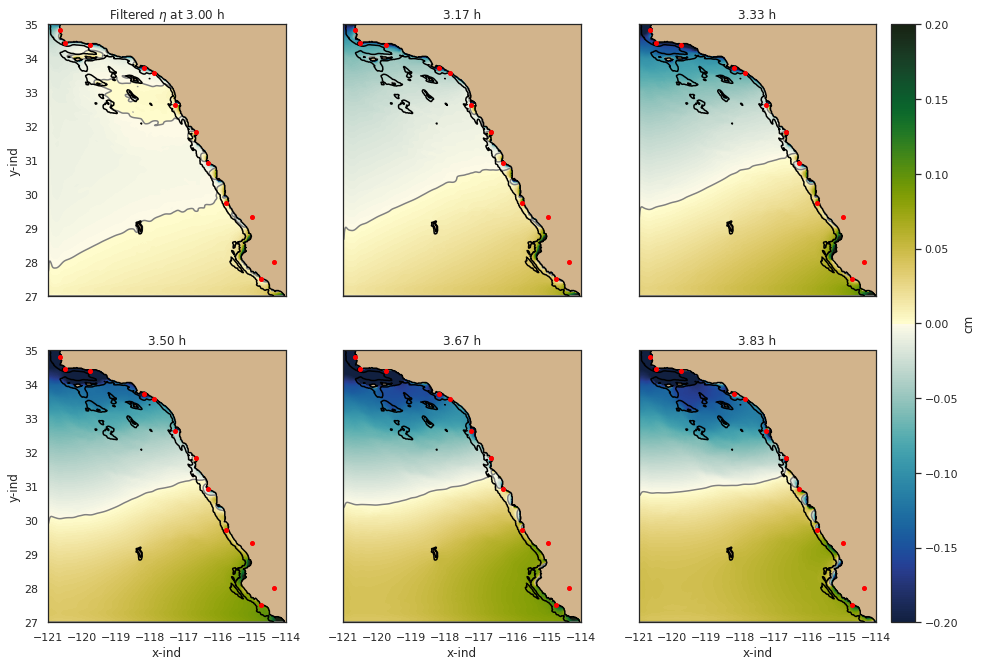

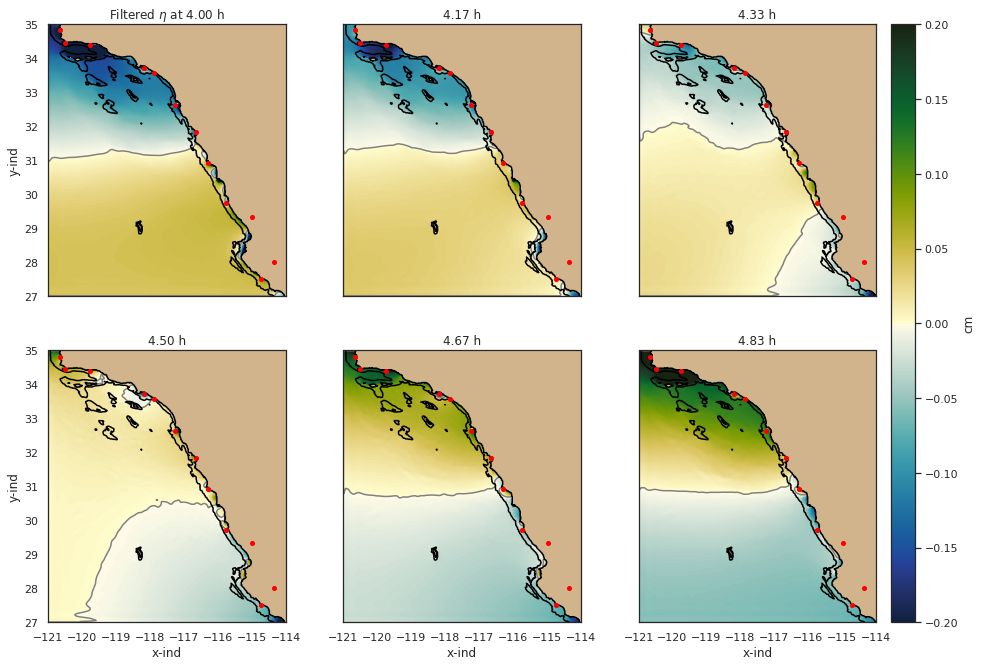

...

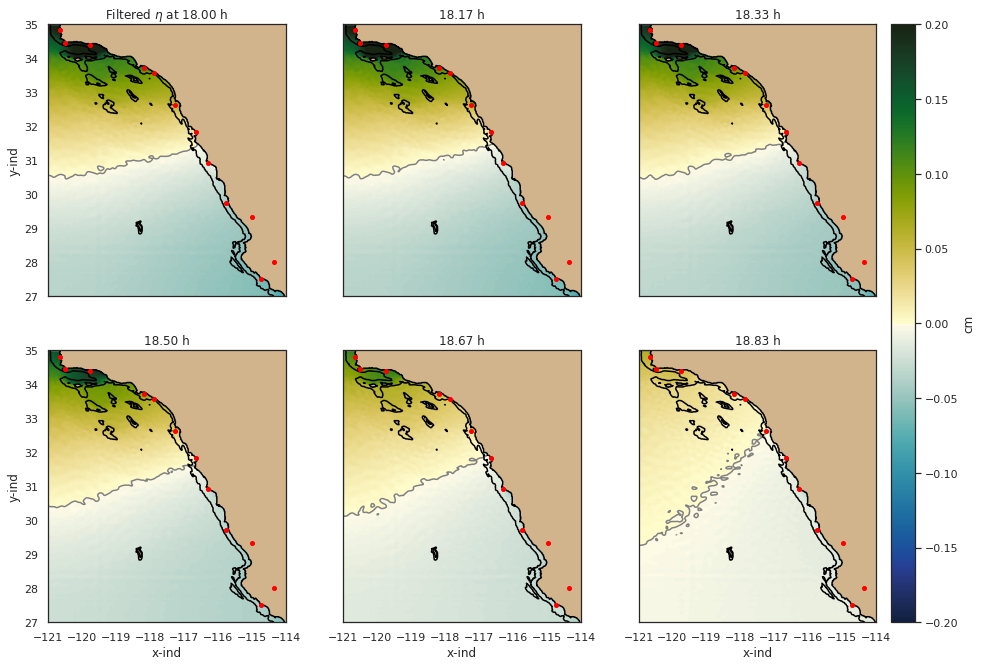

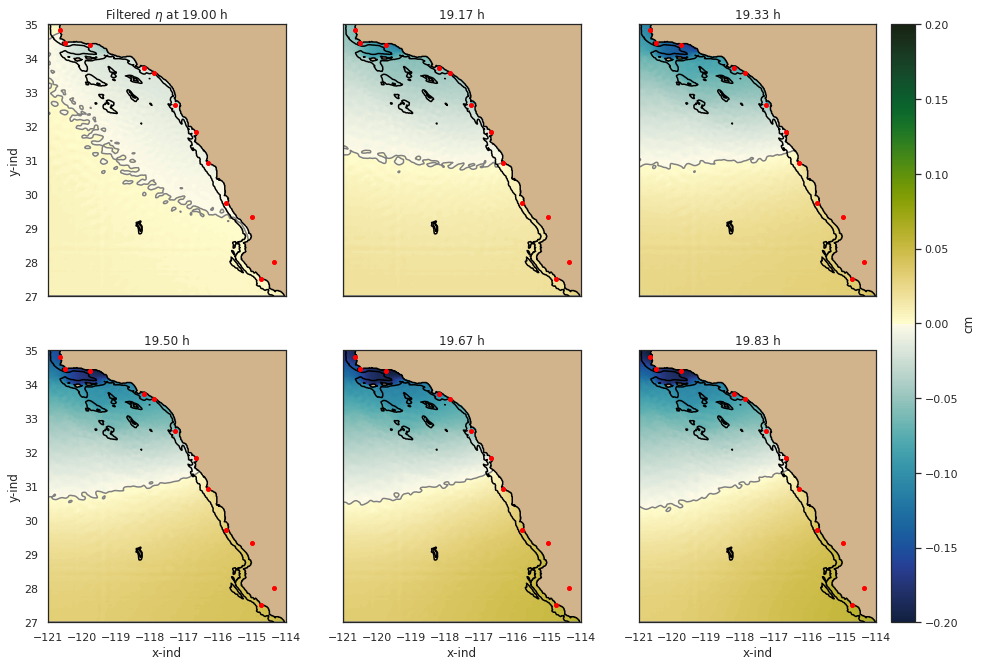

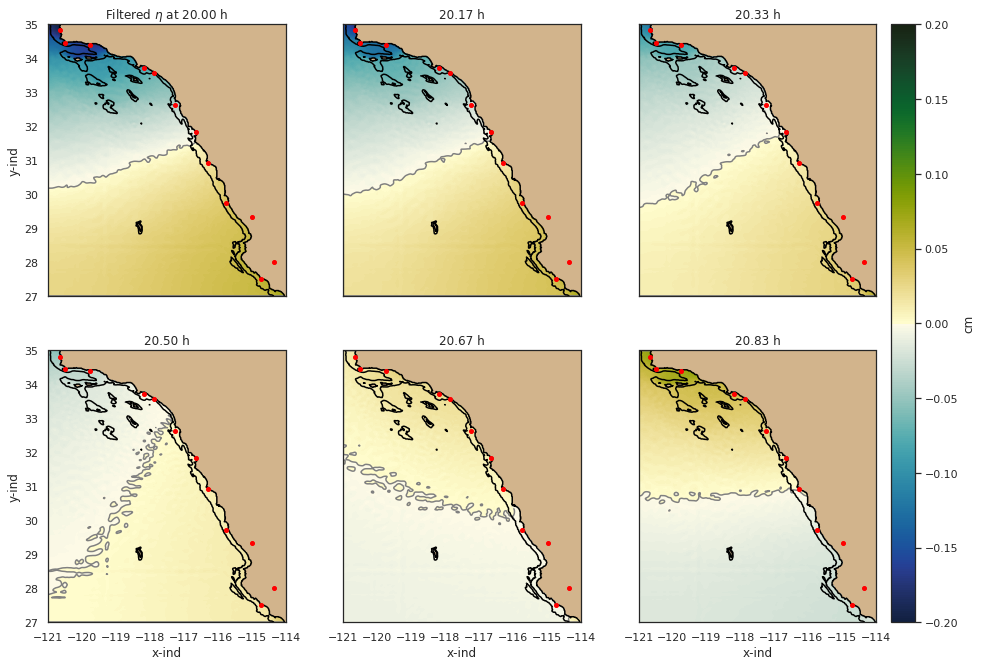

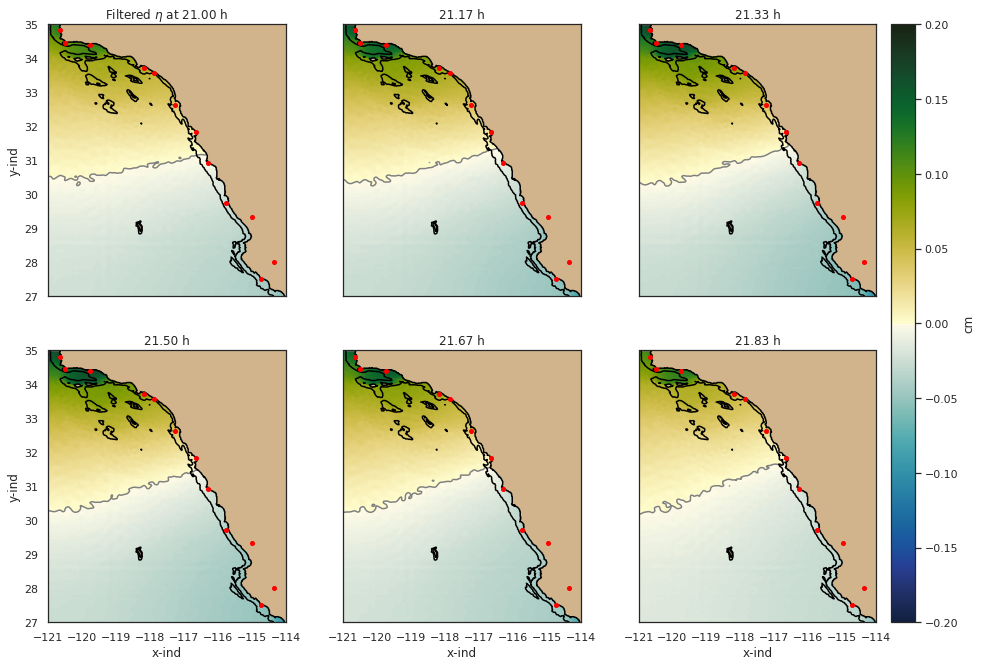

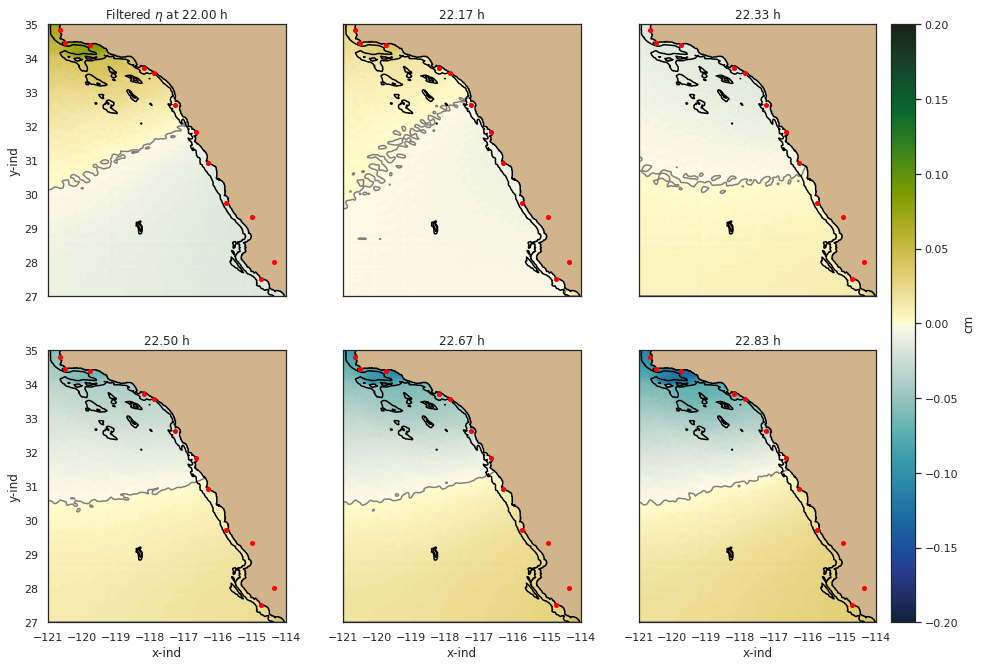

In [24]:
sns.set_context('notebook')
for nt in range(0,138,6):
    fig,ax0,ax1,ax2,ax3,ax4,ax5 = plot_ssh_filt(nt, ssh_filt)

#### Filter periods below 8 hr

In [25]:
fs = samp_freq
freq = 1/(8*3600) #6
lowcut = freq
ssh_filt_low = butter_lowpass_filter(ds['ETAN'][:], lowcut, fs, order=5, axis=0)

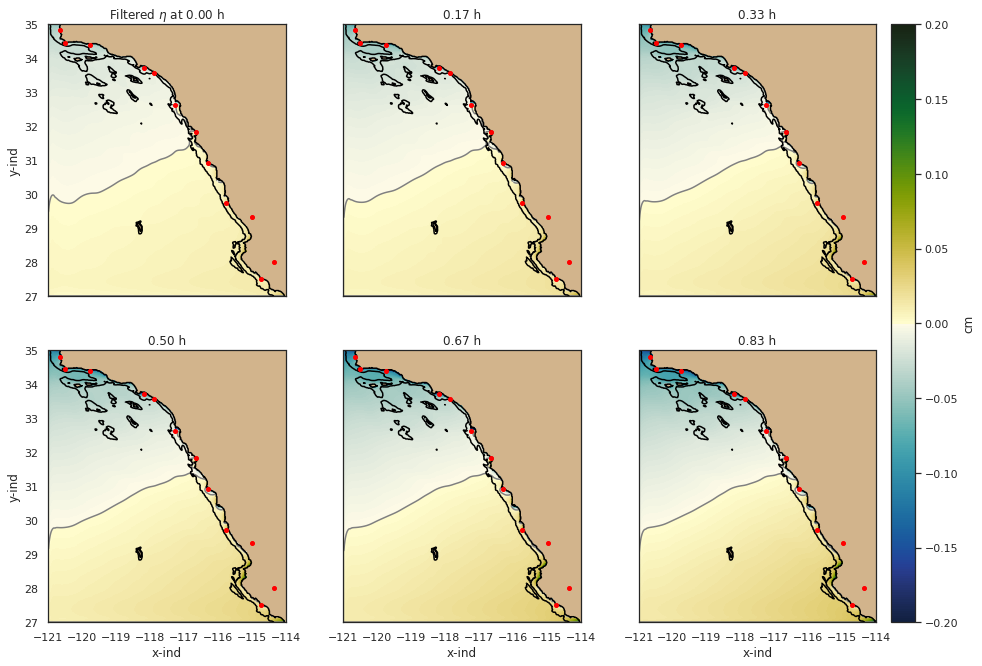

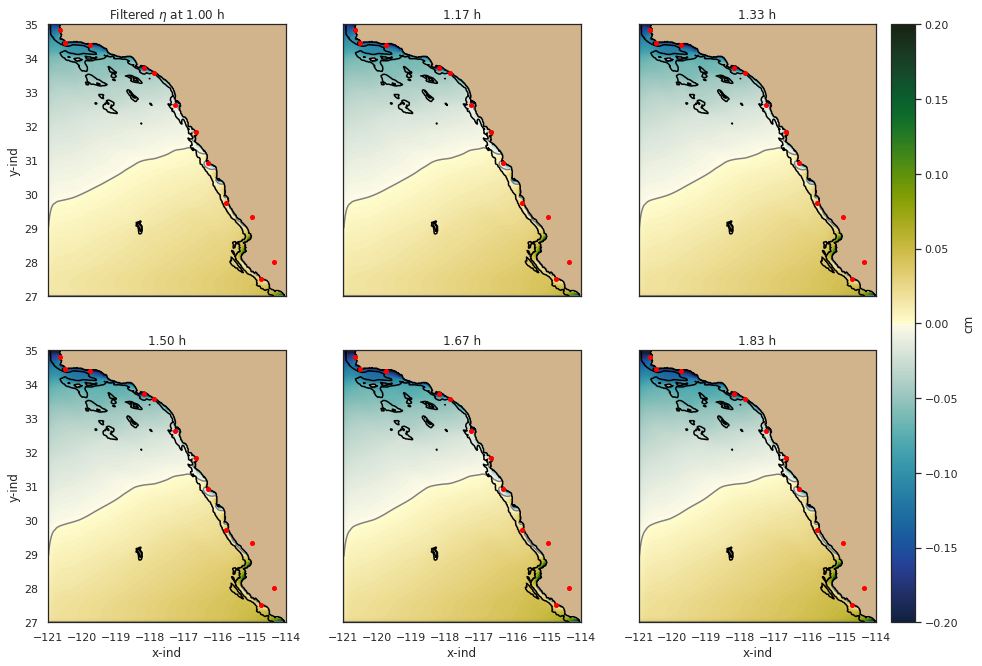

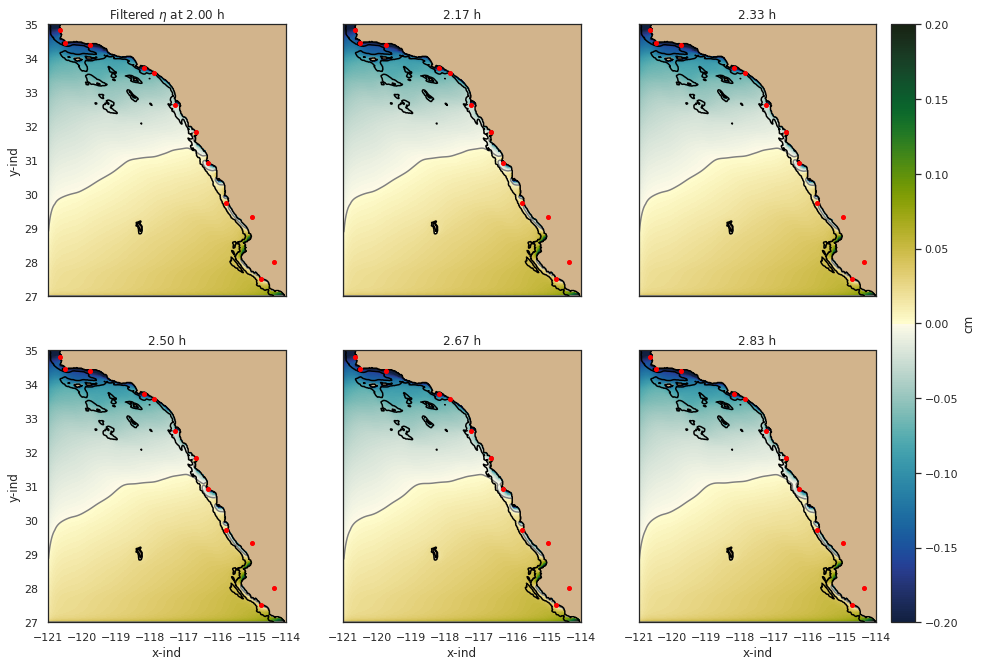

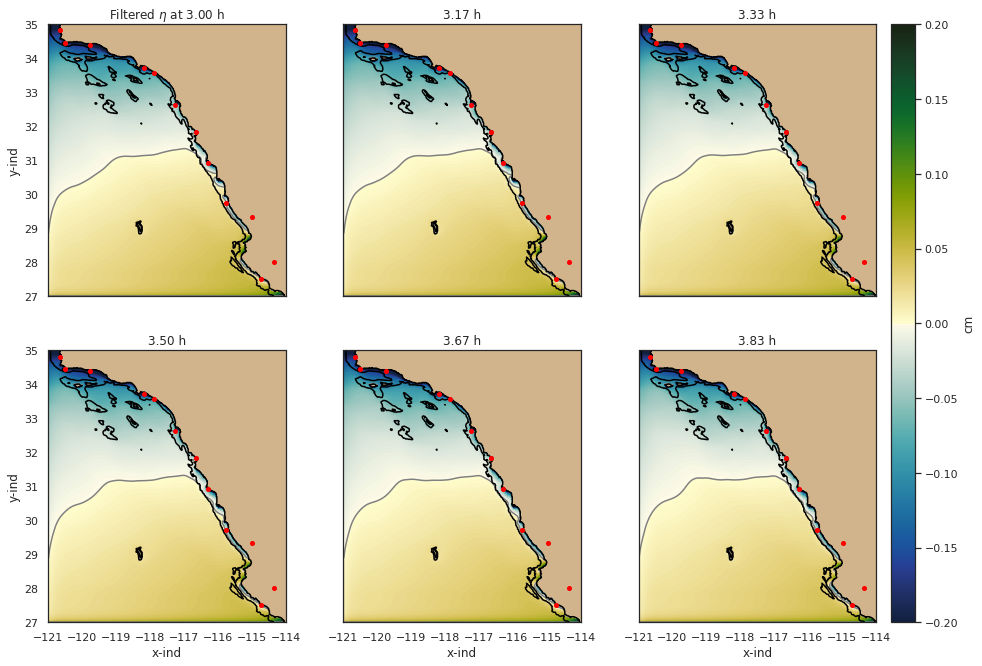

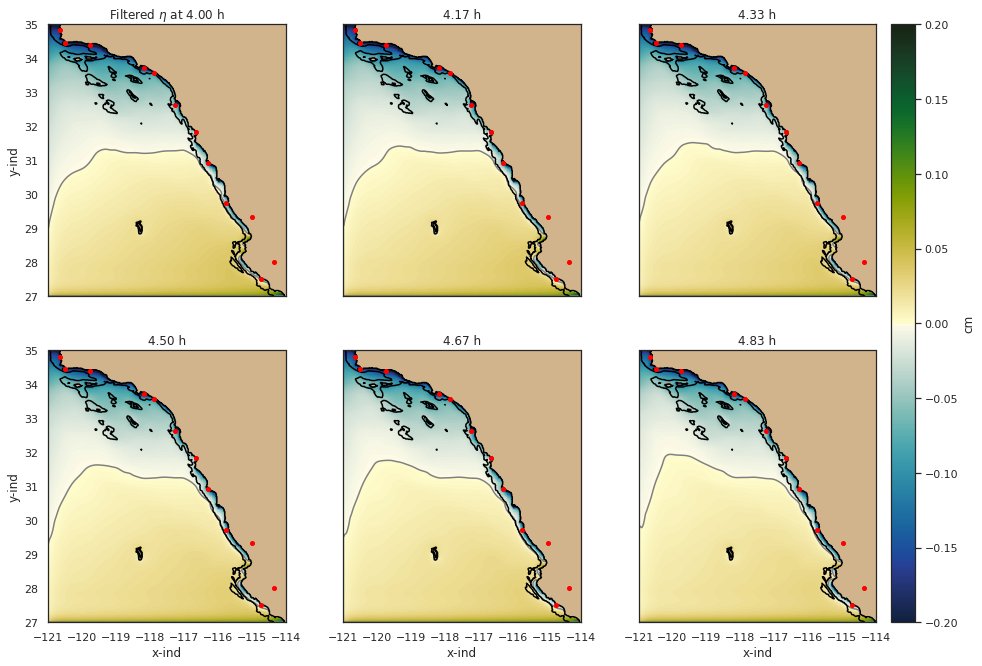

...

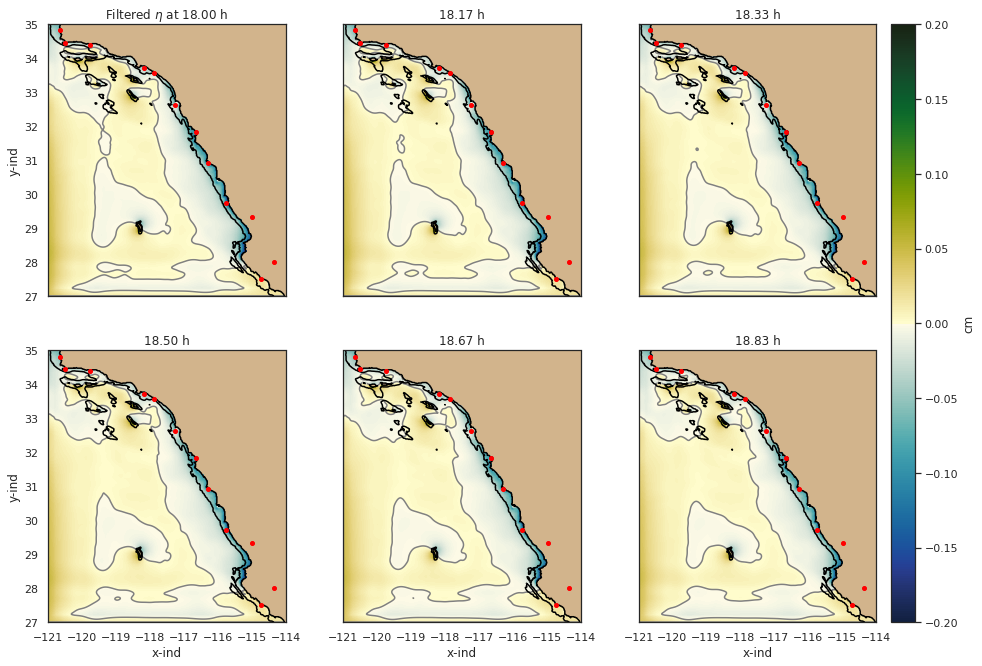

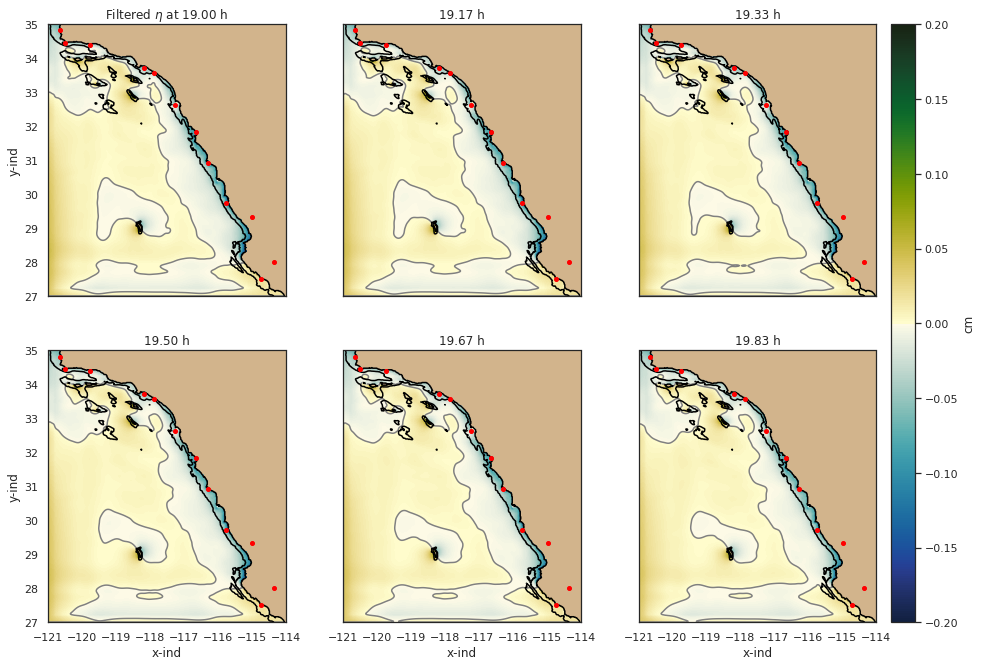

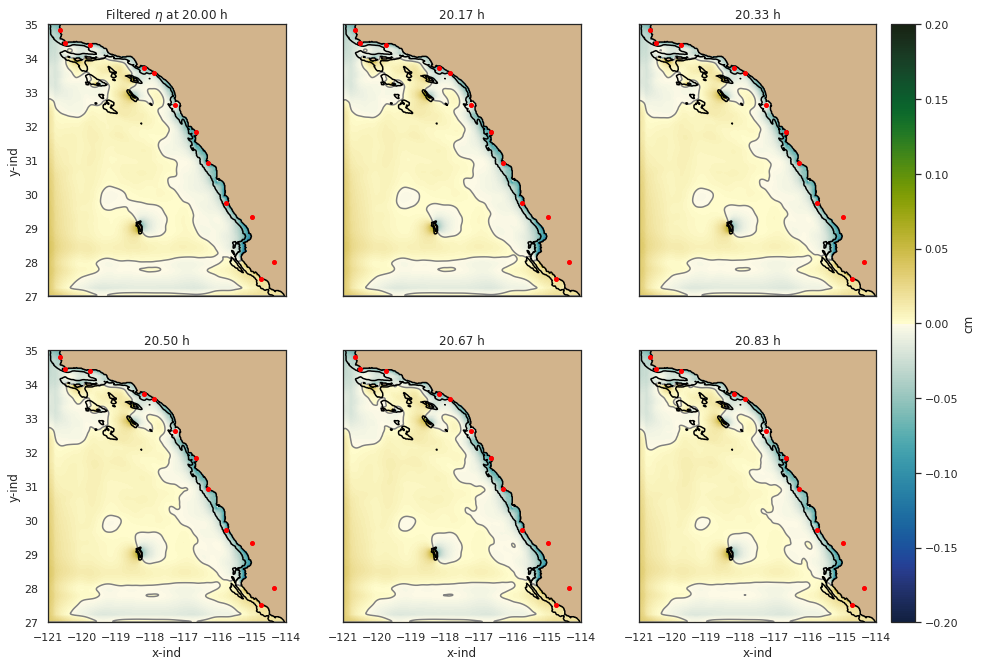

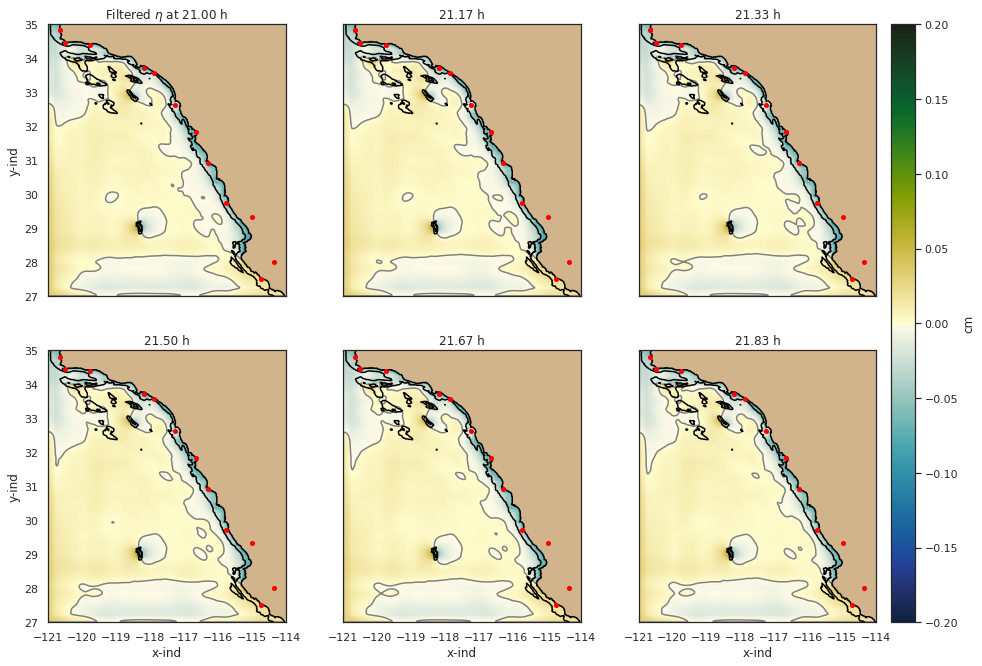

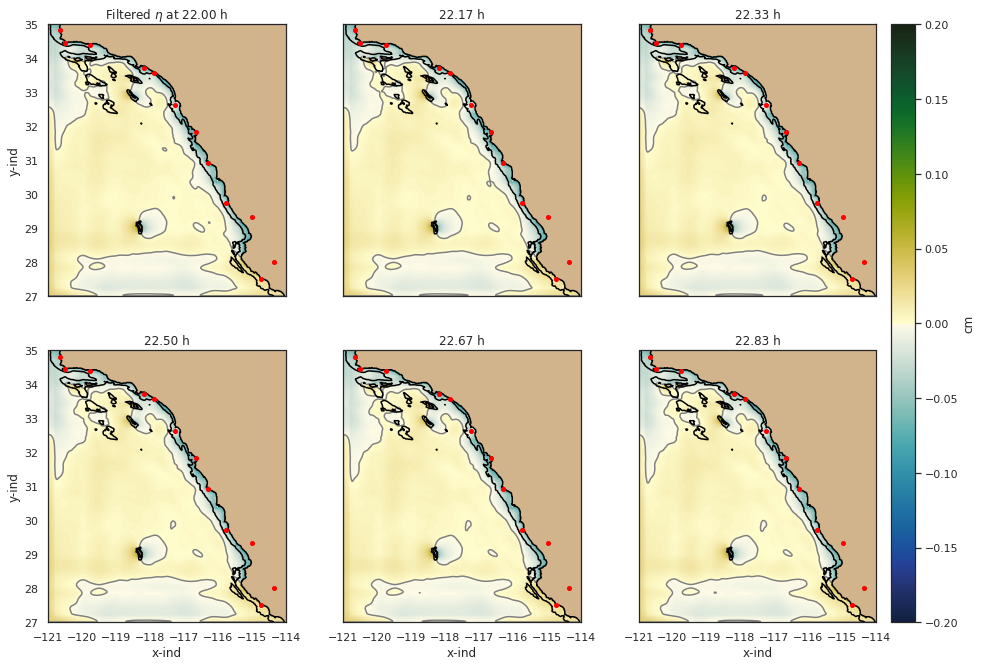

In [26]:
sns.set_context('notebook')
for nt in range(0,138,6):
    fig,ax0,ax1,ax2,ax3,ax4,ax5 = plot_ssh_filt(nt, ssh_filt_low)